### This script enables exploratory investigation of traces, demonstrating how to use the CosmosTraces object. 
### This script does not produce any final figures. 

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%load_ext line_profiler
# %pdb

import os
from IPython.core.debugger import set_trace
from matplotlib import pyplot as plt
from matplotlib import gridspec
import numpy as np
import time
import scipy.stats

import h5py
from scipy.ndimage.filters import gaussian_filter1d
from sklearn.cluster.bicluster import SpectralCoclustering
from sklearn.cluster import DBSCAN
from sklearn.metrics import consensus_score


import cosmos.traces.trace_analysis_utils as utils
from cosmos.behavior.bpod_dataset import BpodDataset
import cosmos.imaging.atlas_registration as reg
from cosmos.traces.cell_plotter import CellPlotter
from cosmos.traces.cosmos_traces import CosmosTraces

import cosmos.params.trace_analyze_params as params 

/home/user/anaconda3/envs/cosmostools3_keras222_mplt21_2/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
%pdb

Automatic pdb calling has been turned ON


In [4]:
# Select dataset.
workstation = 'cosmosdata' #'analysis2'
if workstation == 'analysis2':
    data_dir = '/home/izkula/Dropbox/cosmos_data/'
    fig_save_dir = '/home/izkula/Dropbox/cosmos/trace_analysis/'
    bpod_dir = '/home/izkula/Dropbox/cosmos_data/behavior/'
elif workstation == 'cosmosdata':
    data_dir = '/home/user/Dropbox/cosmos_data/'
    fig_save_dir = '/home/user/Dropbox/cosmos/trace_analysis/'
    bpod_dir = '/home/user/Dropbox/cosmos_data/behavior/'

### Good datasets:
### 7 (m72 good)
### 11 (m943 good)
### 18 (m945 good) 
### 19 (m194 good)  
dataset_id = 11 #7 #11 #12
dataset = params.DATASETS[dataset_id]
print(dataset)
dataset['data_root'] = data_dir
dataset['fig_save_dir'] = fig_save_dir
dataset['behavior_dir'] = bpod_dir

{'date': '20180420', 'name': 'cux2ai148m943_COSMOSTrainMultiBlockGNG_1', 'bpod_file': 'cux2m943/COSMOSTrainMultiBlockGNG/Session Data/cux2m943_COSMOSTrainMultiBlockGNG_20180420_130634.mat', 'regressors_name': 'cux2m943-20180420-130639', 'info': '***This has good behavior. 1084 sources'}


(1/3) Loading trace data.
(2/3) Loading behavior data.
While loading bpod, enforcing that ntrials is:194
lick rates bin size: 0.034
lick rates bin size: 0.034
lick rates bin size: 0.034
lick rates bin size: 0.034
Saving to:  /home/user/Dropbox/cosmos/trace_analysis/20180420/cux2ai148m943_COSMOSTrainMultiBlockGNG_1/polar_pre-reward.pdf
Saving to:  /home/user/Dropbox/cosmos/trace_analysis/20180420/cux2ai148m943_COSMOSTrainMultiBlockGNG_1/polar_post-reward.pdf
Saving to:  /home/user/Dropbox/cosmos/trace_analysis/20180420/cux2ai148m943_COSMOSTrainMultiBlockGNG_1/licks.pdf
Saving to:  /home/user/Dropbox/cosmos/trace_analysis/20180420/cux2ai148m943_COSMOSTrainMultiBlockGNG_1/success_rate.pdf
LED trials: 195
Processing traces.
[ -0.98693836 480.98693836]
[346.31439921 364.68560079]
Elapsed time: 19.696852922439575


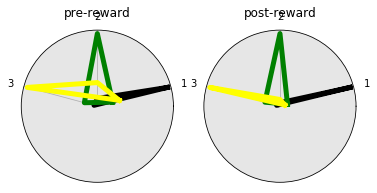

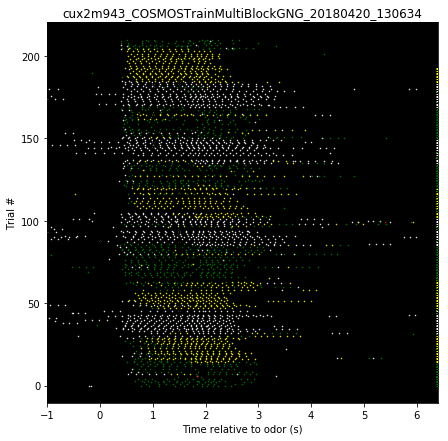

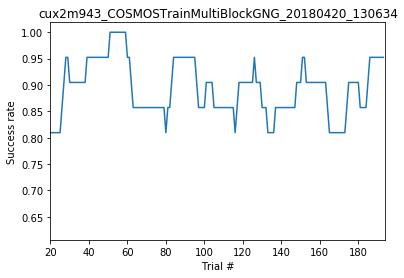

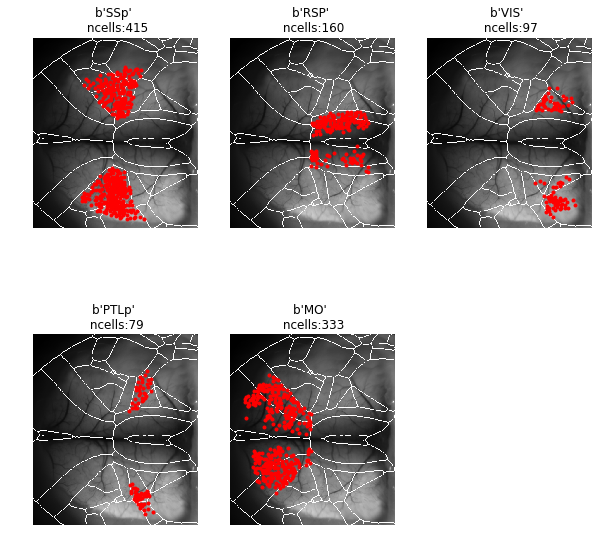

In [5]:
# Load data.
startt = time.time()

CT = CosmosTraces(dataset, do_region_plots=True)
BD = CT.bd

print('Elapsed time: '+str(time.time() - startt))

# TODO : Plot atlas overlay to check that it looks good. 

In [6]:
# Setup some analysis specific variables.
smooth_spikes = gaussian_filter1d(CT.St, 1.5, axis=1, mode='constant')

# Define trial sets.
use_all_trials = True

if use_all_trials:
    clean_trials = np.ones(BD.success.shape)
    min_block_trial = 0
else:
    clean_trials = np.zeros(BD.success.shape)
    clean_trials[BD.get_clean_trials(min_selectivity=0.95)] = 1
    min_block_trial = 7

lick_spout1 = np.logical_and.reduce((BD.go_trials.astype('bool'), 
                                     BD.success, 
                                     BD.spout_positions==1,
                                     BD.ind_within_block>=min_block_trial,
                                     clean_trials))
lick_spout3 = np.logical_and.reduce((BD.go_trials.astype('bool'), 
                                     BD.success, 
                                     BD.spout_positions==3,
                                     BD.ind_within_block>=min_block_trial, 
                                     clean_trials))
lick_spout4 = np.logical_and.reduce((BD.go_trials.astype('bool'), 
                                     BD.success, 
                                     BD.spout_positions==4,
                                     BD.ind_within_block>=min_block_trial, 
                                     clean_trials))
nolick = np.logical_and.reduce((~BD.go_trials.astype('bool'), 
                                BD.success))

trial_sets = (lick_spout1, lick_spout3, lick_spout4, nolick)

False
---Plotting contours: 9.422332048416138 seconds ---


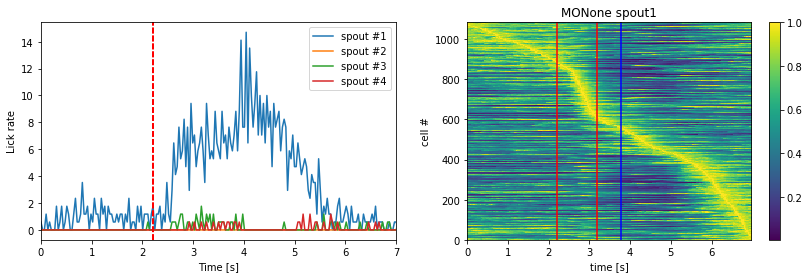

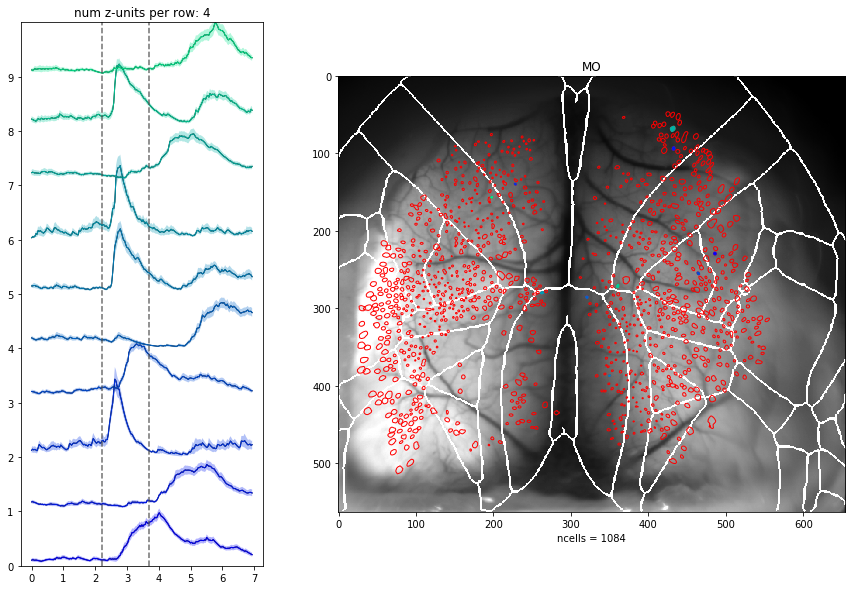

In [7]:
# Make general summary plots for specified cells and trials. 

# Select cells and regions.
region = 'MO'
hemisphere = None #0
spout_num = 1
which_cells = np.array(CT.cells_in_region[CT.regions[region]])
if hemisphere is not None:
    which_cells = which_cells[np.where(CT.hemisphere_of_cell[which_cells]==hemisphere)[0]]
    
use_all_cells = True
if use_all_cells:
    which_cells = np.arange(np.shape(CT.Ct)[0])

lick_spout_trials = np.logical_and.reduce((BD.go_trials.astype('bool'), 
                                            BD.success, 
                                            BD.spout_positions==spout_num))

# Generate trial averages for specified trials and cells.
trials = lick_spout_trials
trials = trials[:CT.Ct.shape[2]]
traces = CT.Ct[which_cells,:,:][:,:,trials[:]]
footprints = CT.footprints[:,:,which_cells]
trial_means = np.mean(traces, axis=2)
trial_sems = scipy.stats.sem(traces, axis=2)


# Make plots.
plt.figure(figsize=(14,4))
BD.plot_mean_lick_rates(trials, ax=plt.subplot('121'))
plt.gca().set_xlim([0, 7])
ordering1 = utils.plot_average_trial_raster(trial_means, 
                                            bpod_data=CT.bd, 
                                            ordering='peak', 
                                            do_normalize=True, 
                                            dt = CT.dt,
                                            ax=plt.subplot('122'), 
                                            title=region+str(hemisphere)
                                                  +' spout'+str(spout_num))
ordering = CT.plot_variance_shaded_traces(trial_means, trial_sems, 
                                          cell_inds=np.arange(10, 20), # Set this
                                          footprints=footprints,
                                          ordering='var', 
                                          title=region) 
plt.savefig(os.path.join(CT.fig_save_path, 'overview.pdf'), transparent=True, rasterized=True, dpi=600)


In [13]:
### Compute session performance.
np.sum(CT.bd.success)/len(CT.bd.success)

0.8917525773195877

In [18]:
### Get event frames (i.e. trial start, odor onset, reward onset)
event_frames = CT.fps*np.array([0, BD.stimulus_times[0], 
                             BD.stimulus_times[0]+1.5])


In [14]:
# Generate videos where each cell is represented by a circle centered on the centroid
# of its ROI, and the size/alpha/color correspond to its activity.

do_generate_centroid_videos = True
do_test_visual_stim = False # Set true when using m72_vis_stim_2

if do_generate_centroid_videos:
    if do_test_visual_stim:
        ### Testing out centroid_movie with visual stim
        rates = gaussian_filter1d(CT.St, 1.5, axis=1, mode='constant')
        mean_vid = np.mean(rates[:,:,:], axis=2)

        mean_vid = scipy.stats.zscore(mean_vid, axis=1)
        save_dir = os.path.join(fig_save_dir, 'mean_vids', 'vis')
        if not os.path.isdir(save_dir):
            os.makedirs(save_dir)
        utils.centroid_movie(mean_vid, np.arange(mean_vid.shape[0]), CT.centroids, CT.atlas_tform, max_radius=500,
                              save_dir=save_dir, do_square=False)   

    else:
        trial_types = (lick_spout1, lick_spout3, lick_spout4)
        trial_names = ['spout1', 'spout3', 'spout4']

        rates = gaussian_filter1d(CT.St, 1.5, axis=1, mode='constant')

        for ind, trials in enumerate(trial_types):
            save_dir = os.path.join(fig_save_dir, 'mean_vids', str(dataset_id), trial_names[ind])
            if not os.path.isdir(save_dir):
                os.makedirs(save_dir)

            mean_vid = np.mean(rates[:,:,trials], axis=2)
            mean_vid = scipy.stats.zscore(mean_vid, axis=1)
            title_list = ['BASELINE']*int(np.floor(CT.event_frames[1]))
            title_list.extend(['ODOR']*30)
            title_list.extend(['']*15)
            title_list.extend(['REWARD']*30)
            title_list.extend(['']*(mean_vid.shape[1]-len(title_list)))
            utils.centroid_movie(mean_vid, np.arange(mean_vid.shape[0]), CT.centroids, CT.atlas_tform, max_radius=50,
                                 save_dir=save_dir, title_list=title_list)

0...1...

/home/user/anaconda3/envs/cosmostools3_keras222_mplt21_2/lib/python3.6/site-packages/matplotlib/collections.py:836: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


2...3...4...5...6...7...8...9...10...11...12...13...14...15...16...17...18...19...20...21...22...23...24...25...26...27...28...29...30...31...32...33...34...35...36...37...38...39...40...41...42...43...44...45...46...47...48...49...50...51...52...53...54...55...56...57...58...59...60...61...62...63...64...65...66...67...68...69...70...71...72...73...74...75...76...77...78...79...80...81...82...83...84...85...86...87...88...89...90...91...92...93...94...95...96...97...98...99...100...101...102...103...104...105...106...107...108...109...110...111...112...113...114...115...116...117...118...119...120...121...122...123...124...125...126...127...128...129...130...131...132...133...134...135...136...137...138...139...140...141...142...143...144...145...146...147...148...149...150...151...152...153...154...155...156...157...158...159...160...161...162...163...164...165...166...167...168...169...170...171...172...173...174...175...176...177...178...179...180...181...182...183...184...185...18

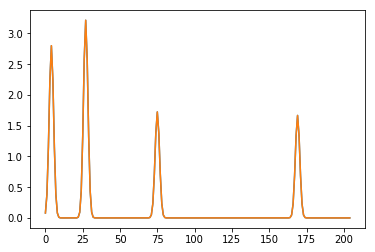

In [10]:
### Set rates here (i.e. could use fluorescence or spikes)
rates = smooth_spikes
rates_flat = np.reshape(rates, (rates.shape[0], rates.shape[1]*rates.shape[2]), order='F')

# Double check that the reshaping is correct
plt.plot(rates_flat[1,205:410])
plt.plot(rates[1,:,1])

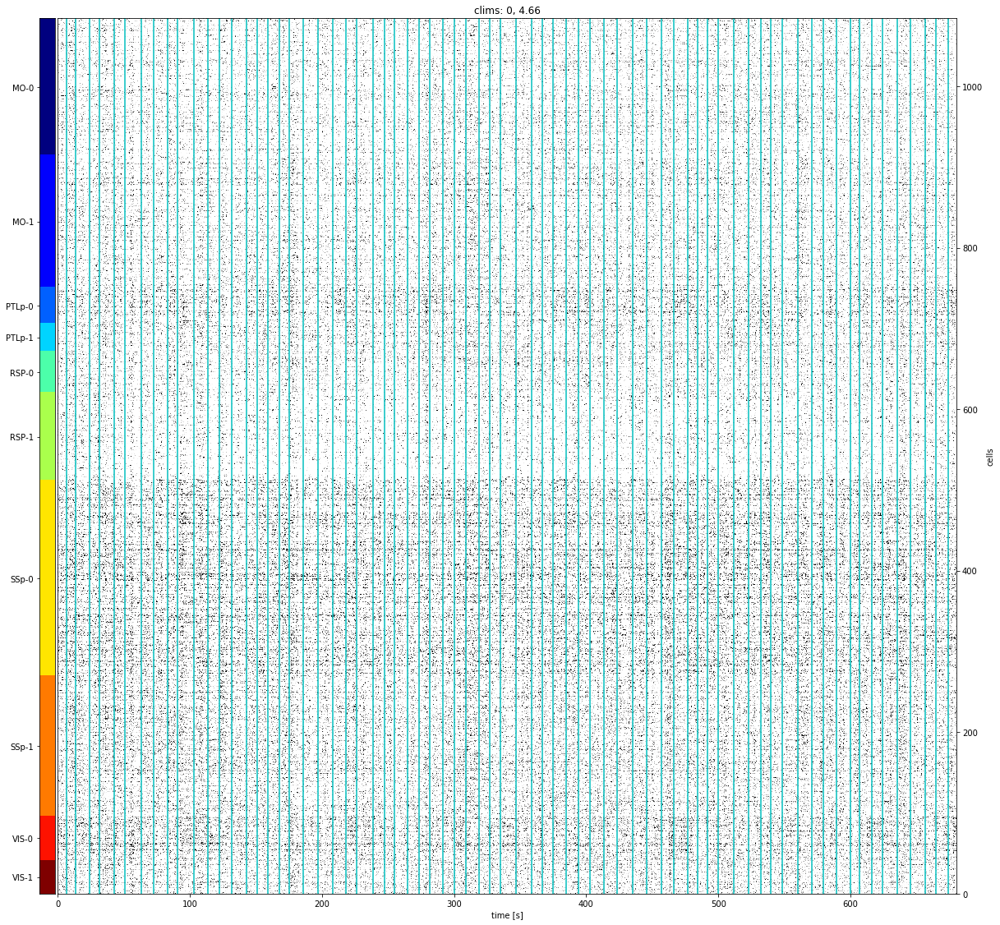

In [17]:
CT.plot_raster_by_region(traces=gaussian_filter1d(CT.S, 2, axis=1), startframe=0, 
                         nframes=20000, event_frames=CT.led_frames)
plt.savefig(os.path.join(CT.fig_save_path, 'raster_zoom1.pdf'), transparent=True, 
            rasterized=True, dpi=600)

MO
VIS
SSp
PTLp
RSP


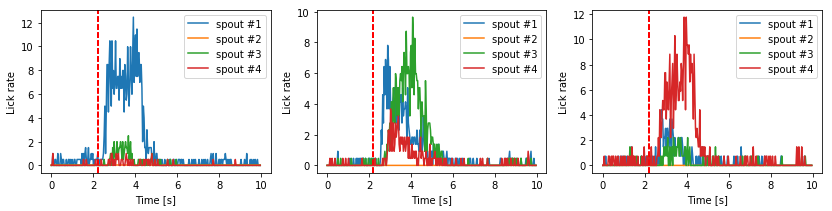

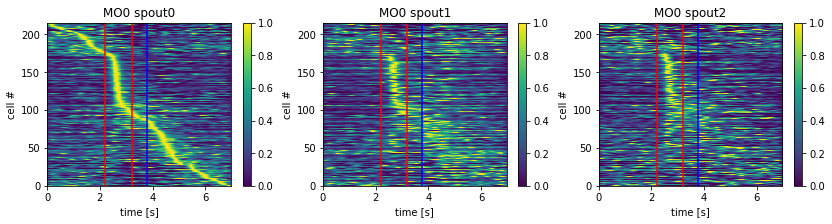

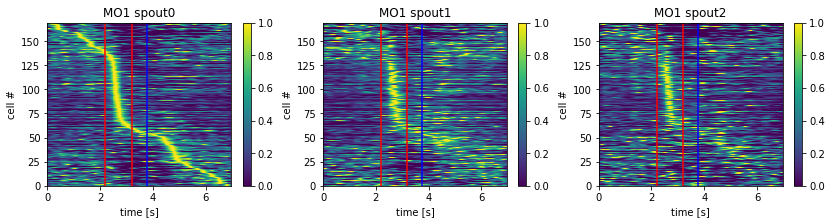

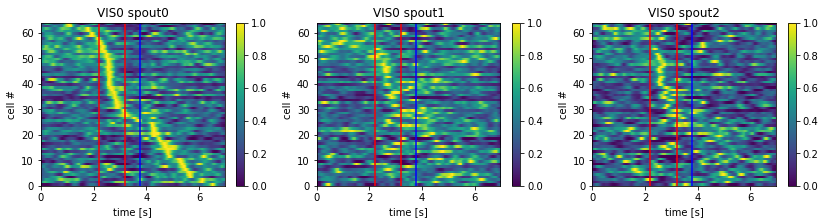

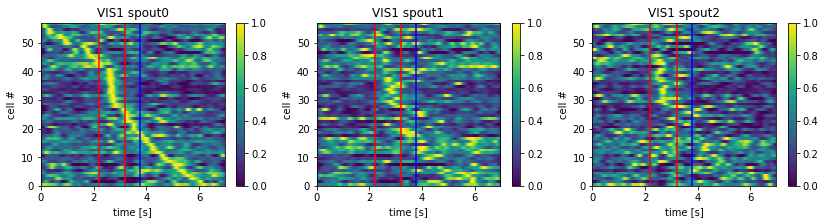

...

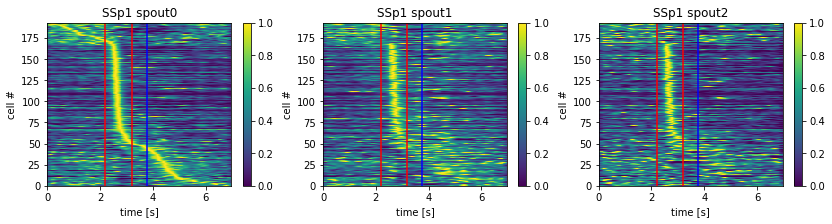

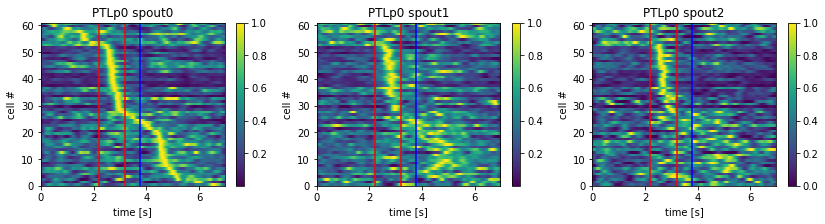

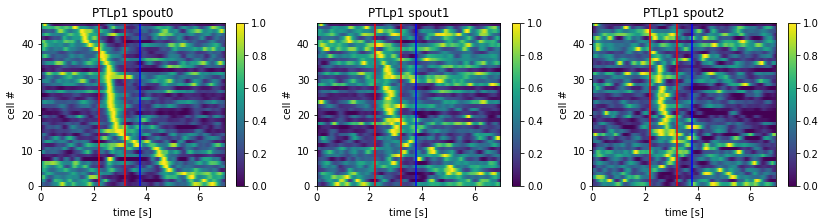

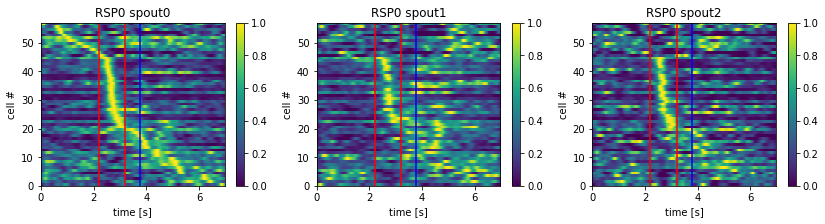

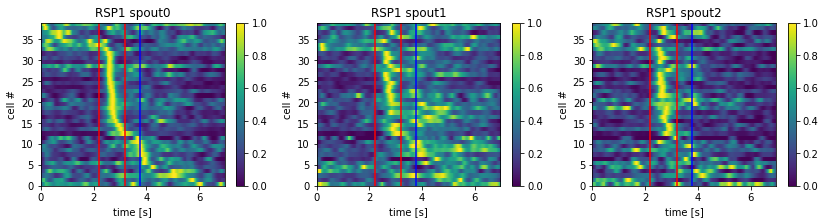

In [10]:
# Plot averaged rasters for each region, across each trial type
# Select cells and regions.
do_save = True


trial_sets = (lick_spout1, lick_spout3, lick_spout4)

plt.figure(figsize=(14,3))
BD.plot_mean_lick_rates(lick_spout1, ax=plt.subplot('131'))
BD.plot_mean_lick_rates(lick_spout3, ax=plt.subplot('132'))
BD.plot_mean_lick_rates(lick_spout4, ax=plt.subplot('133'))

if do_save:
    save_dir = os.path.join(CT.fig_save_path + '/trial_avgs/')
    if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
    plt.savefig(save_dir + 'trial_avg_licks' + '.png' )

# Generate trial averages for specified trials and cells.
for region in ['MO', 'VIS', 'SSp', 'PTLp', 'RSP']:
    print(region)
    for hemisphere in [0, 1]:
        which_cells = np.array(CT.cells_in_region[CT.regions[region]])
        if hemisphere is not None:
            which_cells = which_cells[np.where(CT.hemisphere_of_cell[which_cells]
                                               ==hemisphere)[0]]
        plt.figure(figsize=(14,3))
        for ind, trials in enumerate(trial_sets):
            traces = CT.St_smooth[which_cells,:,:][:,:,np.where(trials[:-1])[0]]
            footprints = CT.footprints[:,:,which_cells]
            trial_means = np.mean(traces, axis=2)
            trial_sems = scipy.stats.sem(traces, axis=2)

            # Make plots.
            if ind == 0:
                ordering1 = utils.plot_average_trial_raster(trial_means, 
                                                        bpod_data=CT.bd, 
                                                        ordering='peak', 
                                                        do_normalize=True, 
                                                        dt = CT.dt,
                                                        ax=plt.subplot('13'+str(ind+1)), 
                                                        title=region+str(hemisphere)
                                                              +' spout'+str(ind))
            else:        
                utils.plot_average_trial_raster(trial_means, 
                                                bpod_data=CT.bd, 
                                                ordering=ordering1, # ordering='peak',
                                                do_normalize=True, 
                                                dt = CT.dt,
                                                ax=plt.subplot('13'+str(ind+1)), 
                                                title=region+str(hemisphere)
                                                      +' spout'+str(ind))
           
        if do_save:
            save_dir = os.path.join(CT.fig_save_path + '/trial_avgs/')
            if not os.path.isdir(save_dir):
                os.makedirs(save_dir)
            plt.savefig(save_dir + 'trial_avg_' + region + str(hemisphere) + '.png' )

In [13]:
# Find trial-type selective cells.

stim_frame = np.round(CT.fps*np.mean(CT.bd.stimulus_times)).astype(int)
reward_frame = np.round(stim_frame + 1.5*CT.fps).astype(int)

# frame_range = [stim_frame-30, stim_frame] # Set this.
frame_range = [stim_frame, stim_frame+60] 
# frame_range = [reward_frame+30, reward_frame+60] 
# frame_range = [stim_frame+30, stim_frame+44] 
do_include_nogo = False

if do_include_nogo:
    trial_sets = (lick_spout1, lick_spout3, lick_spout4, nolick)
else:
    trial_sets = (lick_spout1, lick_spout3, lick_spout4)


selection = utils.get_trial_type_selective_cells(CT.Ct,
                                                 frame_range,
                                                 trial_sets,
                                                 maxpval=1e-3,
                                                 post_hoc='maxdist')
good_cells = selection[0]
range_mean = selection[1]
range_sem = selection[2]
pvals = selection[3]
most_sig = selection[4]
sig_vals = selection[5]

False
---Plotting contours: 1.4854841232299805 seconds ---
False
---Plotting contours: 0.6018686294555664 seconds ---
False
---Plotting contours: 0.5702474117279053 seconds ---


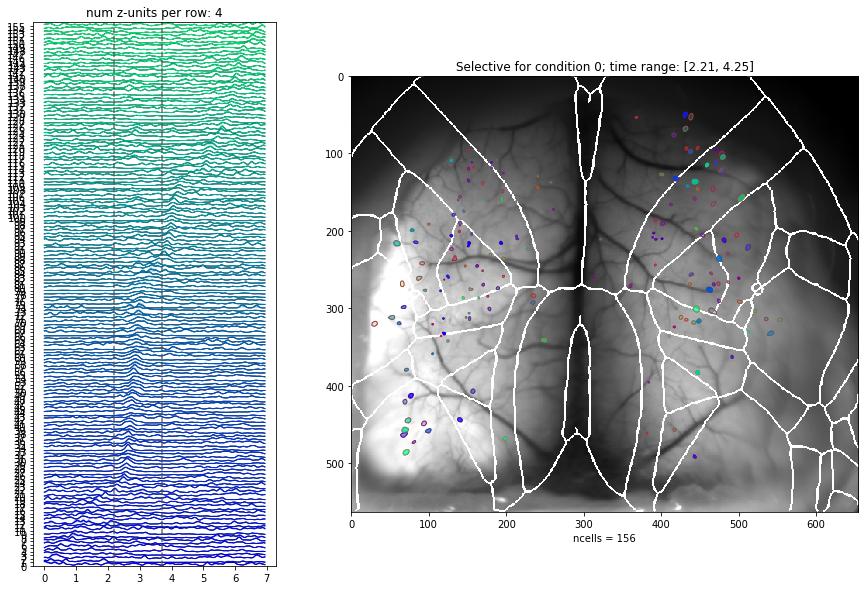

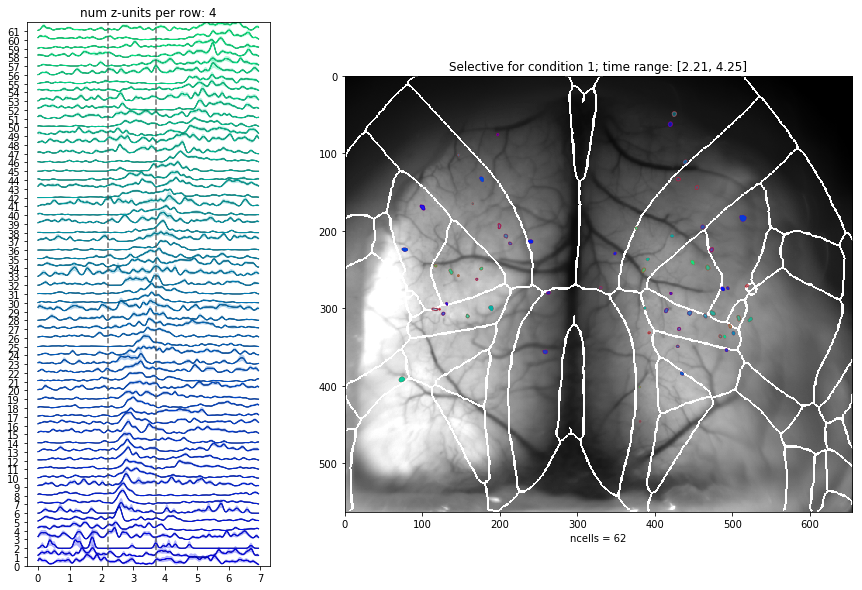

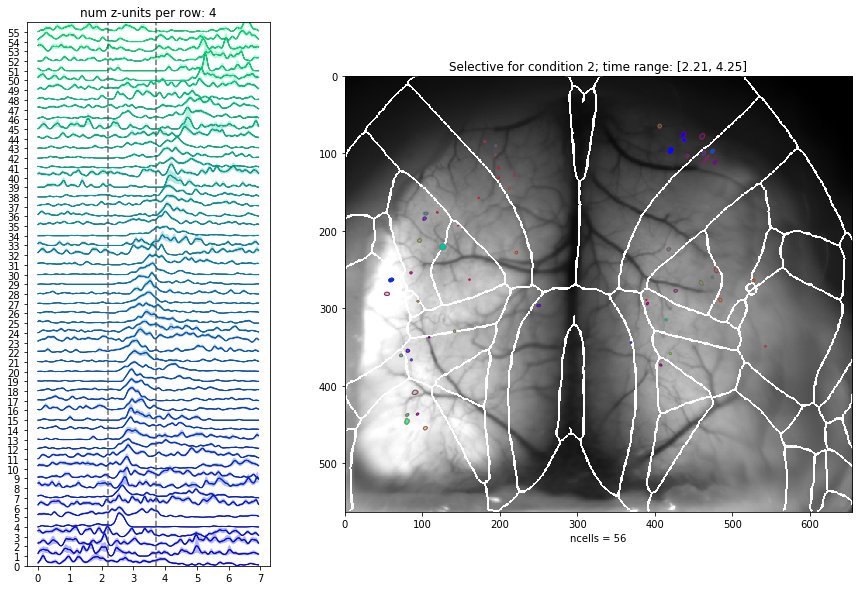

In [14]:
# Plot locations of the trial_selective cells.
# Are there trends in the spatial location of cells discriminative for each condition?
for condition in [0, 1, 2]:
    which_cells = good_cells[np.where(most_sig==condition)[0]]
    which_sig = sig_vals[np.where(most_sig == condition)[0]]
    trials = trial_sets[condition]

    # Generate trial averages for specified trials and cells.
#     traces = CT.Ct[which_cells,:,:][:,:,trials]
    traces = rates[which_cells,:,:][:,:,trials]
    footprints = CT.footprints[:,:,which_cells]
    trial_means = np.mean(traces, axis=2)
    trial_sems = scipy.stats.sem(traces, axis=2)

    alpha = which_sig/np.percentile(which_sig, 95)
    alpha[np.where(alpha>1)[0]] = 1
#     alpha = np.ones(np.shape(alpha))
    title = 'Selective for condition {}; time range: [{:.2f}, {:.2f}]'.format(condition,
                                                                           CT.Tt[frame_range[0]],
                                                                           CT.Tt[frame_range[1]])
    ordering = CT.plot_variance_shaded_traces(trial_means, trial_sems, 
                                              cell_inds=np.arange(0,len(which_cells)),
                                              footprints=footprints,
                                              ordering='peak', 
                                              title=title, 
                                              alpha=alpha) 

---Plotting contours: 0.09779953956604004 seconds ---
---Plotting contours: 0.09955930709838867 seconds ---
---Plotting contours: 0.08580827713012695 seconds ---
---Plotting contours: 0.08589625358581543 seconds ---
---Plotting contours: 0.08359813690185547 seconds ---
---Plotting contours: 0.07886314392089844 seconds ---
---Plotting contours: 0.09957075119018555 seconds ---
---Plotting contours: 0.11023902893066406 seconds ---
---Plotting contours: 0.09469246864318848 seconds ---
---Plotting contours: 0.09556913375854492 seconds ---
---Plotting contours: 0.09831476211547852 seconds ---
---Plotting contours: 0.1134345531463623 seconds ---
---Plotting contours: 0.08803296089172363 seconds ---
---Plotting contours: 0.08425688743591309 seconds ---
---Plotting contours: 0.09150457382202148 seconds ---
---Plotting contours: 0.0786595344543457 seconds ---
---Plotting contours: 0.07982230186462402 seconds ---
---Plotting contours: 0.0781698226928711 seconds ---
---Plotting contours: 0.0887000

/home/izkula/anaconda/envs/cosmos3/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  "(`matplotlib.pyplot.figure`) are retained until "


---Plotting contours: 0.11075043678283691 seconds ---
---Plotting contours: 0.08810687065124512 seconds ---
---Plotting contours: 0.09381246566772461 seconds ---
---Plotting contours: 0.08850359916687012 seconds ---
---Plotting contours: 0.08966469764709473 seconds ---
---Plotting contours: 0.09645366668701172 seconds ---
---Plotting contours: 0.07819199562072754 seconds ---
---Plotting contours: 0.08976149559020996 seconds ---
---Plotting contours: 0.09977340698242188 seconds ---
---Plotting contours: 0.07996630668640137 seconds ---
---Plotting contours: 0.07935905456542969 seconds ---
---Plotting contours: 0.07867097854614258 seconds ---
---Plotting contours: 0.07938647270202637 seconds ---
---Plotting contours: 0.08380675315856934 seconds ---
---Plotting contours: 0.07795381546020508 seconds ---
---Plotting contours: 0.08212661743164062 seconds ---
---Plotting contours: 0.07899975776672363 seconds ---
---Plotting contours: 0.07954025268554688 seconds ---
---Plotting contours: 0.1044

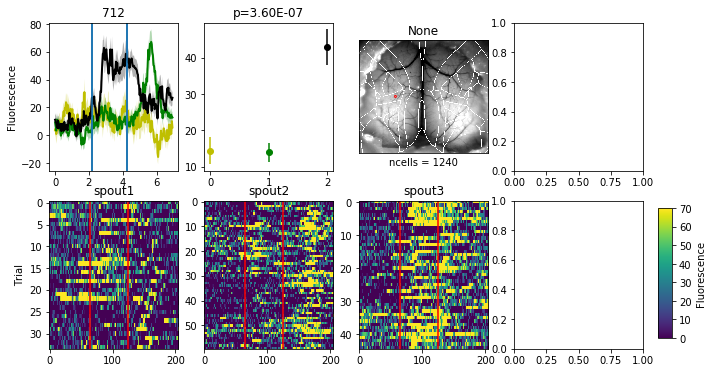

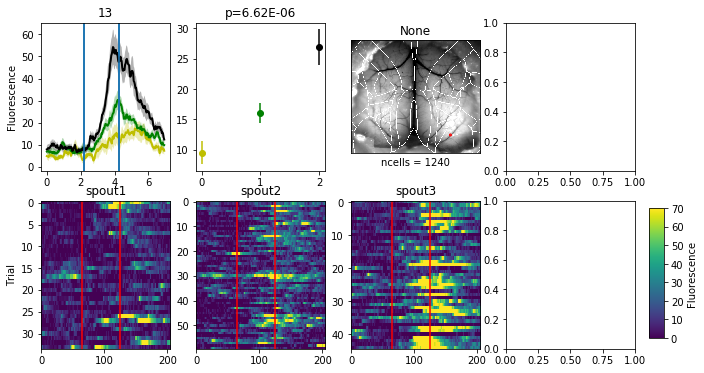

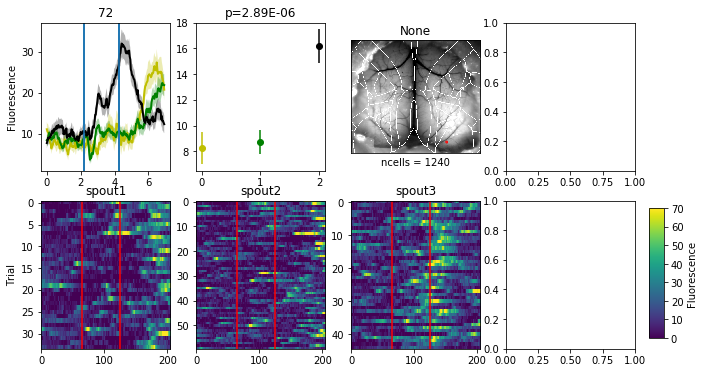

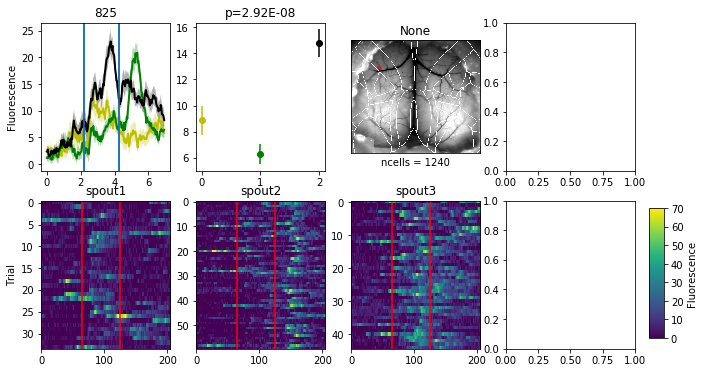

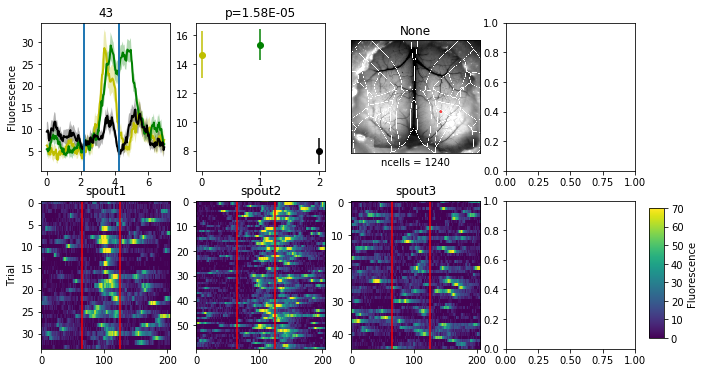

...

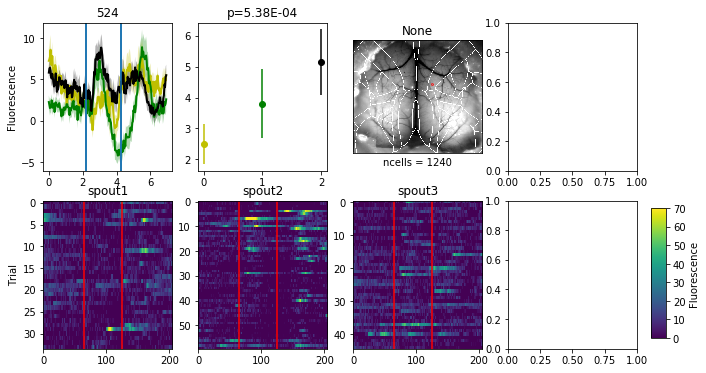

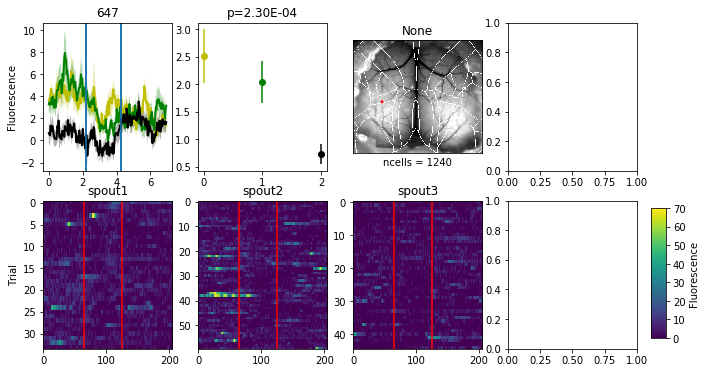

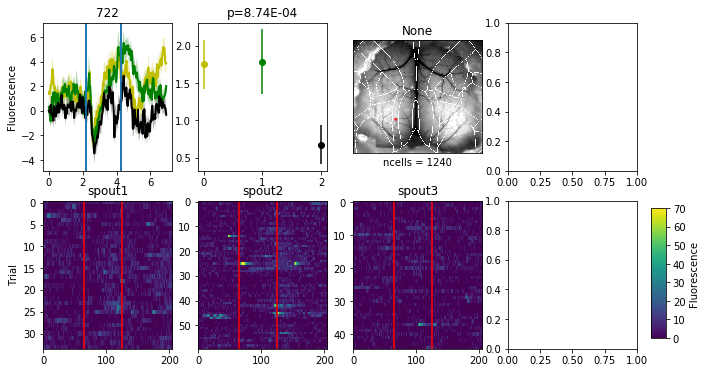

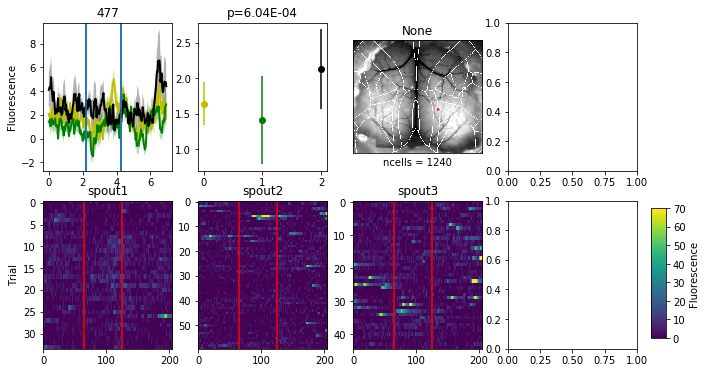

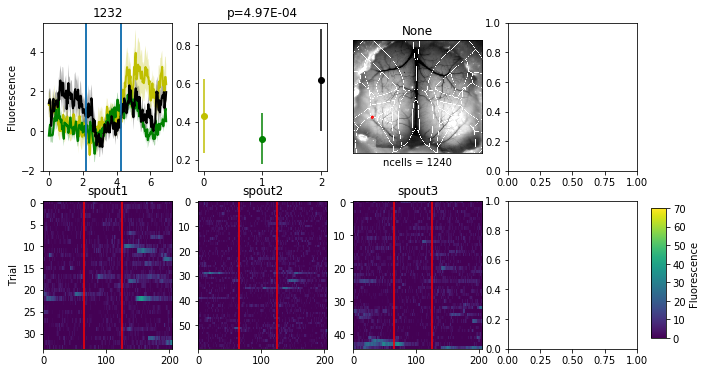

In [57]:
# For each cell, plot overlay of mean response to each of the conditions.

# Specify which cells to look at here.
condition = 2 ### Choose the trial type
which_cells = good_cells[np.where(most_sig == condition)[0]]
which_sig = sig_vals[np.where(most_sig == condition)[0]]

ordering = np.argsort(-which_sig)
which_cells = which_cells[ordering]
# which_cells = np.arange(400, 500)

cells = np.array(which_cells[0:100])

if do_include_nogo:
    names = ('spout1', 'spout2', 'spout3', 'nolick')
    colors = ('y', 'g', 'k', 'r')
else:
    names = ('spout1', 'spout2', 'spout3')
    colors = ('y', 'g', 'k')
    
for cell in cells:
    CT.plot_cell_across_trial_types(cell, frame_range, range_mean, range_sem,
                                    trial_sets, names, colors, pvals)

In [9]:
# Get distance matrix between sources. 
nneurons = rates.shape[0]
distances = np.zeros((nneurons, nneurons))
for neuron in range(nneurons):
    cc = CT.centroids[neuron,:]
    diff = CT.centroids - cc
    distances[neuron,:] = np.sqrt(diff[:, 0]**2 + diff[:, 1]**2)